In [4]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [5]:

df = pd.read_csv('train_data.txt', delimiter=":::", header=None,engine="python")


df.columns = ['Id', 'Title', 'Genre', 'Description']
df

,Id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...
...,...,...,...,...
54209,54210,"""Bonino"" (1953)",comedy,This short-lived NBC live sitcom centered on ...
54210,54211,Dead Girls Don't Cry (????),horror,The NEXT Generation of EXPLOITATION. The sist...
54211,54212,Ronald Goedemondt: Ze bestaan echt (2008),documentary,"Ze bestaan echt, is a stand-up comedy about g..."
54212,54213,Make Your Own Bed (1944),comedy,Walter and Vivian live in the country and hav...


In [3]:
print(df.info())
print(type(df))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54214 entries, 0 to 54213
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Id           54214 non-null  int64 
 1   Title        54214 non-null  object
 2   Genre        54214 non-null  object
 3   Description  54214 non-null  object
dtypes: int64(1), object(3)
memory usage: 1.7+ MB
None
<class 'pandas.core.frame.DataFrame'>


In [4]:
df.isnull().sum()

Id             0
Title          0
Genre          0
Description    0
dtype: int64

In [5]:
df.duplicated().sum()

0

In [6]:
categories = df.Genre.unique()
categories

array([' drama ', ' thriller ', ' adult ', ' documentary ', ' comedy ',
       ' crime ', ' reality-tv ', ' horror ', ' sport ', ' animation ',
       ' action ', ' fantasy ', ' short ', ' sci-fi ', ' music ',
       ' adventure ', ' talk-show ', ' western ', ' family ', ' mystery ',
       ' history ', ' news ', ' biography ', ' romance ', ' game-show ',
       ' musical ', ' war '], dtype=object)

In [7]:
 counts=df['Genre'].value_counts()
    

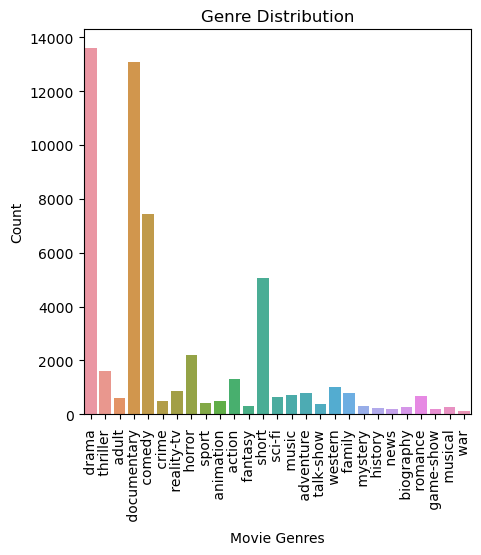

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

x = categories
y =  counts

plt.figure(figsize=(5,5))
sns.countplot(x=df['Genre'], order=x)
plt.xlabel('Movie Genres')
plt.ylabel('Count')
plt.title('Genre Distribution')
plt.xticks(rotation=90)
plt.show()


In [9]:
from wordcloud import WordCloud
import nltk
import re
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

[nltk_data] Downloading package stopwords to C:\Users\Mujtaba
[nltk_data]     Raza\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [10]:
genre_count = df["Genre"].nunique()
genre_count

27

In [11]:

genre_mapper = {genre.strip(): index + 1 for index, genre in enumerate(categories)}


df['genre'] = df['Genre'].str.strip().map(genre_mapper).fillna(0).astype(int)


df.head(10)


,Id,Title,Genre,Description,genre
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,1
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,2
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,3
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,1
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,1
5,6,Quality Control (2011),documentary,Quality Control consists of a series of 16mm ...,4
6,7,"""Pink Slip"" (2009)",comedy,In tough economic times Max and Joey have all...,5
7,8,One Step Away (1985),crime,Ron Petrie (Keanu Reeves) is a troubled teen ...,6
8,9,"""Desperate Hours"" (2016)",reality-tv,"A sudden calamitous event, causing great loss...",7
9,10,Spirits (2014/I),horror,Four high school students embark on a terrify...,8


In [12]:
df.isna().any()

Id             False
Title          False
Genre          False
Description    False
genre          False
dtype: bool

In [13]:
df.drop('Id', axis=1, inplace=True)

In [14]:
corpus = []
ps = PorterStemmer()

for i in range(0, df.shape[0]):
    dialog = re.sub(pattern='[^a-zA-Z]', repl=' ', string=df['Description'][i]) 
    dialog = dialog.lower() 
    words = dialog.split() 
    dialog_words = [word for word in words if word not in set(stopwords.words('english'))] 
    words = [ps.stem(word) for word in dialog_words] 
    dialog = ' '.join(words) 
    corpus.append(dialog) 

In [15]:
corpus[0:3]

['listen convers doctor parent year old oscar learn nobodi courag tell week live furiou refus speak anyon except straight talk rose ladi pink meet hospit stair christma approach rose use fantast experi profession wrestler imagin wit charm allow oscar live life love full compani friend pop corn einstein bacon childhood sweetheart peggi blue',
 'brother sister past incestu relationship current murder relationship murder women reject murder women get close',
 'bu empti student field trip museum natur histori littl tour guid suspect student anoth tour first lectur film co drift dream erot fantasi one imagin film releas emot fantasi erot uncommon way one slip curat offic littl acquisit anoth find anthropologist see bone identifi even head teacher immun soon tour bu depart everyon admit quit educ']

In [16]:
len(corpus)

54214

In [17]:
print(genre_mapper)


{'drama': 1, 'thriller': 2, 'adult': 3, 'documentary': 4, 'comedy': 5, 'crime': 6, 'reality-tv': 7, 'horror': 8, 'sport': 9, 'animation': 10, 'action': 11, 'fantasy': 12, 'short': 13, 'sci-fi': 14, 'music': 15, 'adventure': 16, 'talk-show': 17, 'western': 18, 'family': 19, 'mystery': 20, 'history': 21, 'news': 22, 'biography': 23, 'romance': 24, 'game-show': 25, 'musical': 26, 'war': 27}


In [18]:

drama_words = []
for i in list(df[df['genre'] == 1].index):
    drama_words.append(corpus[i])

thriller_words = []
for i in list(df[df['genre'] == 2].index):
    thriller_words.append(corpus[i])

adult_words = []
for i in list(df[df['genre'] == 3].index):
    adult_words.append(corpus[i])

documentary_words = []
for i in list(df[df['genre'] == 4].index):
    documentary_words.append(corpus[i])

comedy_words = []
for i in list(df[df['genre'] == 5].index):
    comedy_words.append(corpus[i])

crime_words = []
for i in list(df[df['genre'] == 6].index):
    crime_words.append(corpus[i])

reality_tv_words = []
for i in list(df[df['genre'] == 7].index):
    reality_tv_words.append(corpus[i])

horror_words = []
for i in list(df[df['genre'] == 8].index):
    horror_words.append(corpus[i])

sport_words = []
for i in list(df[df['genre'] == 9].index):
    sport_words.append(corpus[i])

animation_words = []
for i in list(df[df['genre'] == 10].index):
    animation_words.append(corpus[i])

action_words = []
for i in list(df[df['genre'] == 11].index):
    action_words.append(corpus[i])

fantasy_words = []
for i in list(df[df['genre'] == 12].index):
    fantasy_words.append(corpus[i])

short_words = []
for i in list(df[df['genre'] == 13].index):
    short_words.append(corpus[i])

sci_fi_words = []
for i in list(df[df['genre'] == 14].index):
    sci_fi_words.append(corpus[i])

music_words = []
for i in list(df[df['genre'] == 15].index):
    music_words.append(corpus[i])

adventure_words = []
for i in list(df[df['genre'] == 16].index):
    adventure_words.append(corpus[i])

talk_show_words = []
for i in list(df[df['genre'] == 17].index):
    talk_show_words.append(corpus[i])

western_words = []
for i in list(df[df['genre'] == 18].index):
    western_words.append(corpus[i])

family_words = []
for i in list(df[df['genre'] == 19].index):
    family_words.append(corpus[i])

mystery_words = []
for i in list(df[df['genre'] == 20].index):
    mystery_words.append(corpus[i])

history_words = []
for i in list(df[df['genre'] == 21].index):
    history_words.append(corpus[i])

news_words = []
for i in list(df[df['genre'] == 22].index):
    news_words.append(corpus[i])

biography_words = []
for i in list(df[df['genre'] == 23].index):
    biography_words.append(corpus[i])

romance_words = []
for i in list(df[df['genre'] == 24].index):
    romance_words.append(corpus[i])

game_show_words = []
for i in list(df[df['genre'] == 25].index):
    game_show_words.append(corpus[i])

musical_words = []
for i in list(df[df['genre'] == 26].index):
    musical_words.append(corpus[i])

war_words = []
for i in list(df[df['genre'] == 27].index):
    war_words.append(corpus[i])




drama = ' '
thriller = ' '
adult = ' '
documentary = ' '
comedy = ' '
crime = ' '
reality_tv = ' '
horror = ' '
sport = ' '
animation = ' '
action = ' '
fantasy = ' '
short = ' '
sci_fi = ' '
music = ' '
adventure = ' '
talk_show = ' '
western = ' '
family = ' '
mystery = ' '
history = ' '
news = ' '
biography = ' '
romance = ' '
game_show = ' '
musical = ' '
war = ' '

for i in range(0, 28):
    drama += drama_words[i]
    thriller += thriller_words[i]
    adult += adult_words[i]
    documentary += documentary_words[i]
    comedy += comedy_words[i]
    crime += crime_words[i]
    reality_tv += reality_tv_words[i]
    horror += horror_words[i]
    sport += sport_words[i]
    animation += animation_words[i]
    action += action_words[i]
    fantasy += fantasy_words[i]
    short += short_words[i]
    sci_fi += sci_fi_words[i]
    music += music_words[i]
    adventure += adventure_words[i]
    talk_show += talk_show_words[i]
    western += western_words[i]
    family += family_words[i]
    mystery += mystery_words[i]
    history += history_words[i]
    news += news_words[i]
    biography += biography_words[i]
    romance += romance_words[i]
    game_show += game_show_words[i]
    musical += musical_words[i]
    war += war_words[i]


 

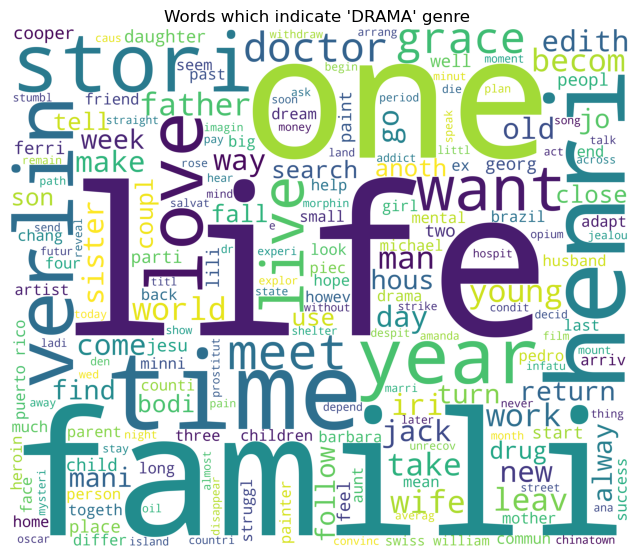

In [19]:
wordcloud1 = WordCloud(background_color='white', width=3000, height=2500).generate(drama)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud1)
plt.axis('off')
plt.title("Words which indicate 'DRAMA' genre ")
plt.show()

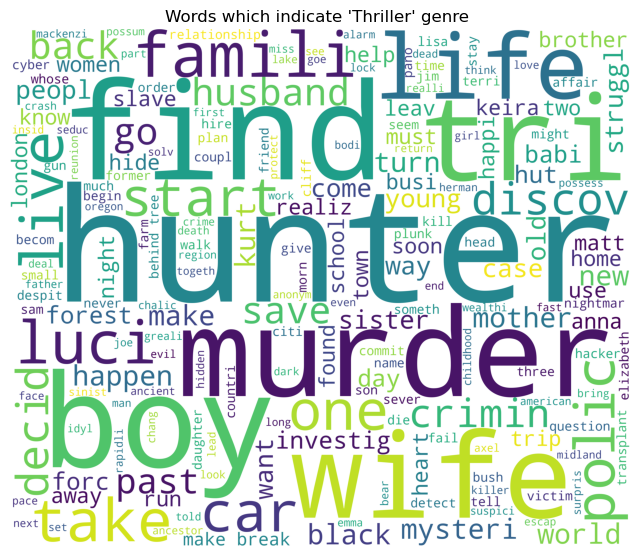

In [20]:
wordcloud2 = WordCloud(background_color='white', width=3000, height=2500).generate(thriller)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud2)
plt.axis('off')
plt.title("Words which indicate 'Thriller' genre ")
plt.show()

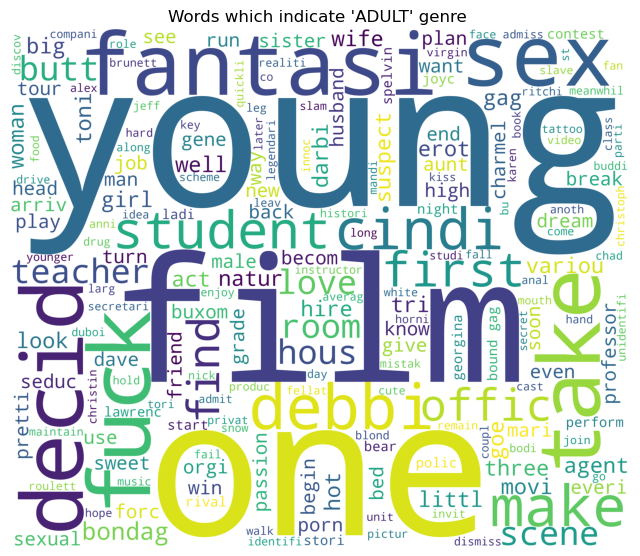

In [21]:
wordcloud3 = WordCloud(background_color='white', width=3000, height=2500).generate(adult)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud3)
plt.axis('off')
plt.title("Words which indicate 'ADULT' genre ")
plt.show()

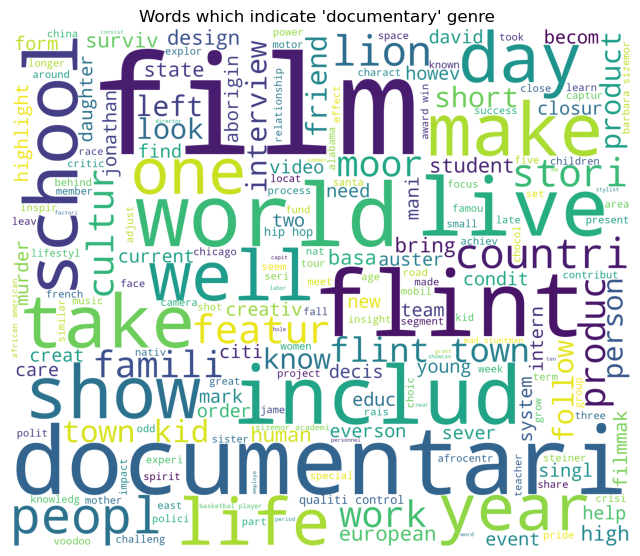

In [22]:
wordcloud4 = WordCloud(background_color='white', width=3000, height=2500).generate(documentary)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud4)
plt.axis('off')
plt.title("Words which indicate 'documentary' genre ")
plt.show()

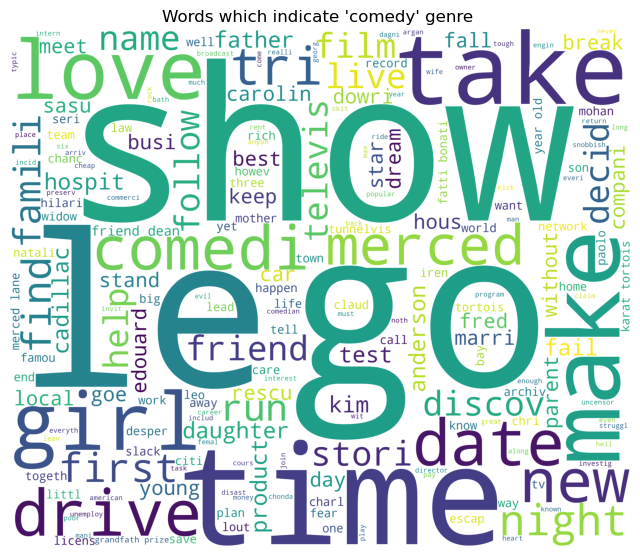

In [23]:
wordcloud5 = WordCloud(background_color='white', width=3000, height=2500).generate(comedy)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud5)
plt.axis('off')
plt.title("Words which indicate 'comedy' genre ")
plt.show()

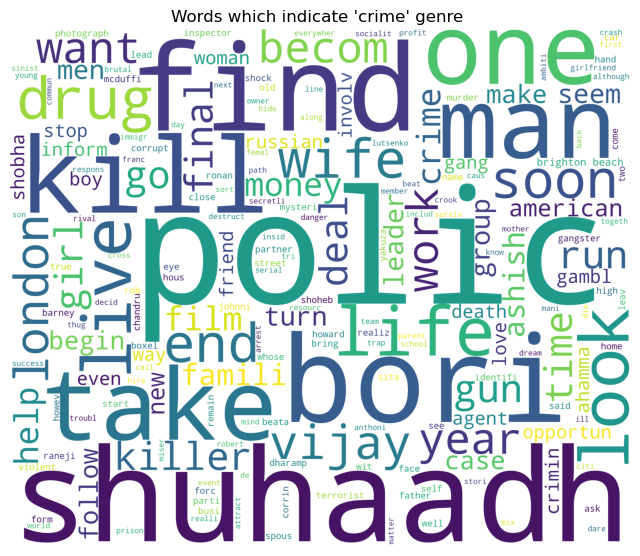

In [24]:
wordcloud6 = WordCloud(background_color='white', width=3000, height=2500).generate(crime)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud6)
plt.axis('off')
plt.title("Words which indicate 'crime' genre ")
plt.show()

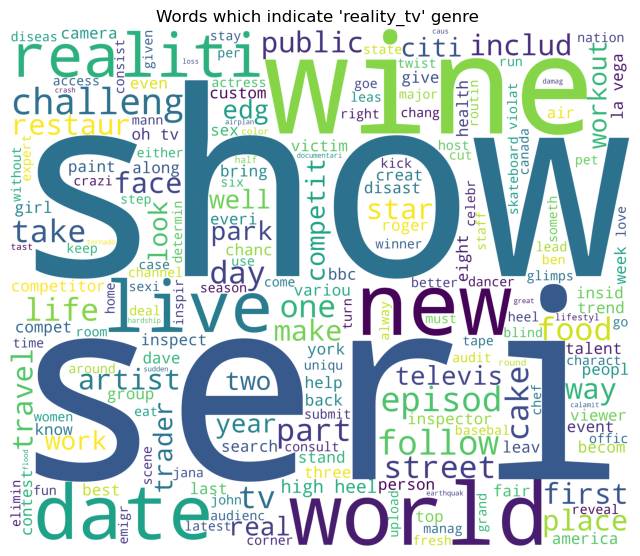

In [25]:
wordcloud7 = WordCloud(background_color='white', width=3000, height=2500).generate(reality_tv)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud7)
plt.axis('off')
plt.title("Words which indicate 'reality_tv' genre ")
plt.show()

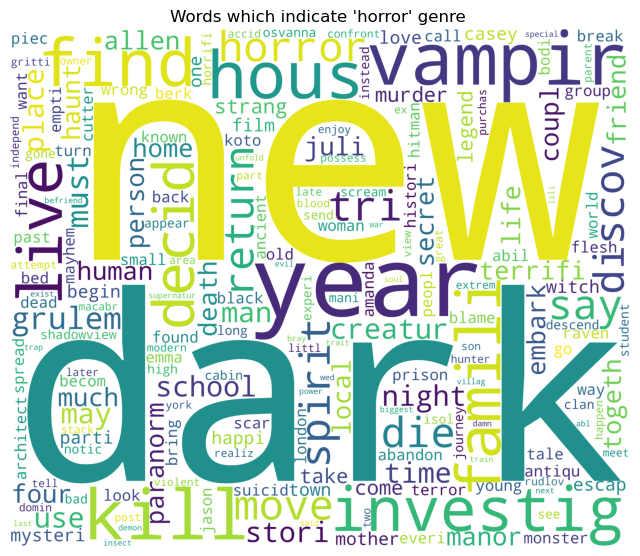

In [26]:
wordcloud8 = WordCloud(background_color='white', width=3000, height=2500).generate(horror)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud8)
plt.axis('off')
plt.title("Words which indicate 'horror' genre ")
plt.show()

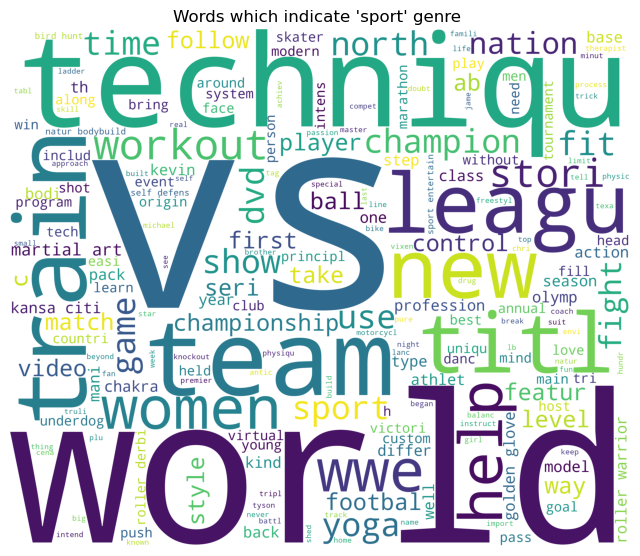

In [27]:
wordcloud9 = WordCloud(background_color='white', width=3000, height=2500).generate(sport)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud9)
plt.axis('off')
plt.title("Words which indicate 'sport' genre ")
plt.show()

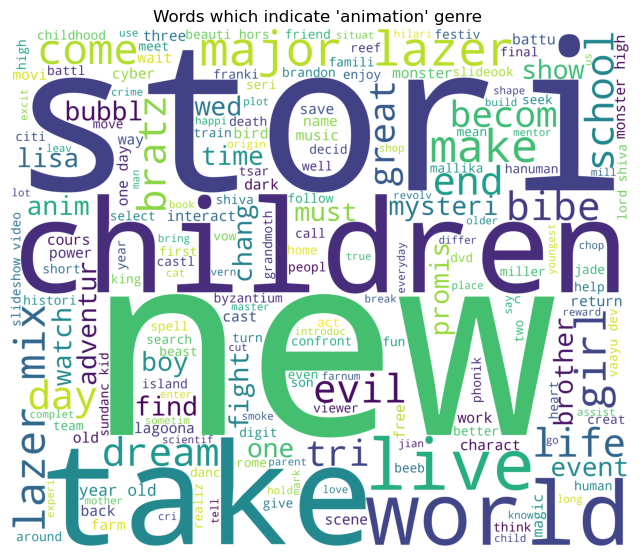

In [28]:
wordcloud10 = WordCloud(background_color='white', width=3000, height=2500).generate(animation)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud10)
plt.axis('off')
plt.title("Words which indicate 'animation' genre ")
plt.show()

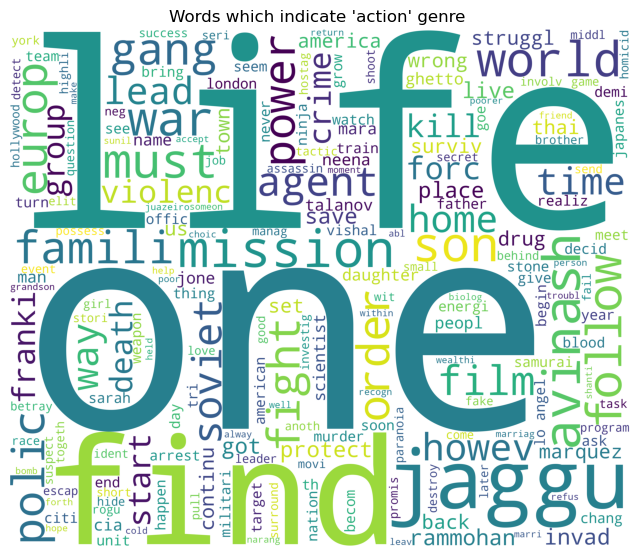

In [29]:
wordcloud11 = WordCloud(background_color='white', width=3000, height=2500).generate(action)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud11)
plt.axis('off')
plt.title("Words which indicate 'action' genre ")
plt.show()

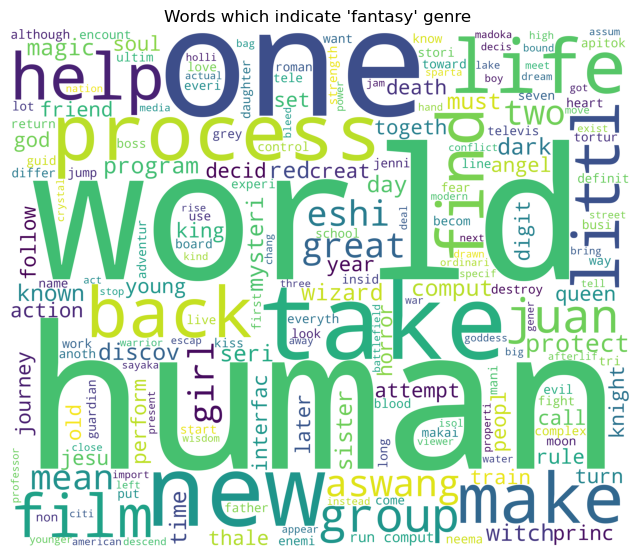

In [30]:
wordcloud12 = WordCloud(background_color='white', width=3000, height=2500).generate(fantasy)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud12)
plt.axis('off')
plt.title("Words which indicate 'fantasy' genre ")
plt.show()

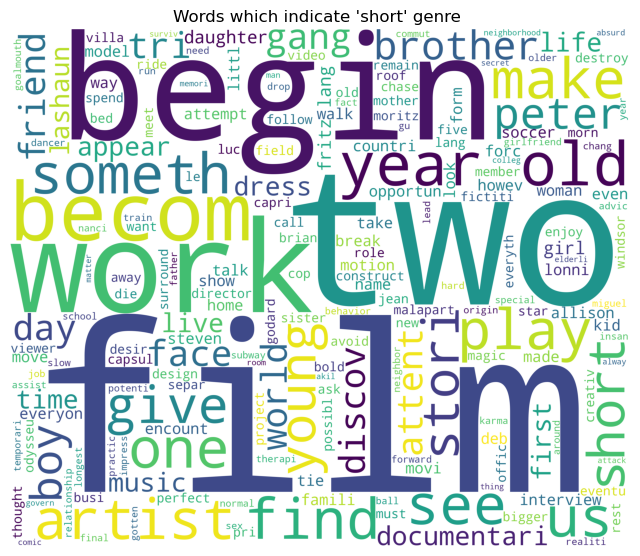

In [31]:
wordcloud13 = WordCloud(background_color='white', width=3000, height=2500).generate(short)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud13)
plt.axis('off')
plt.title("Words which indicate 'short' genre ")
plt.show()

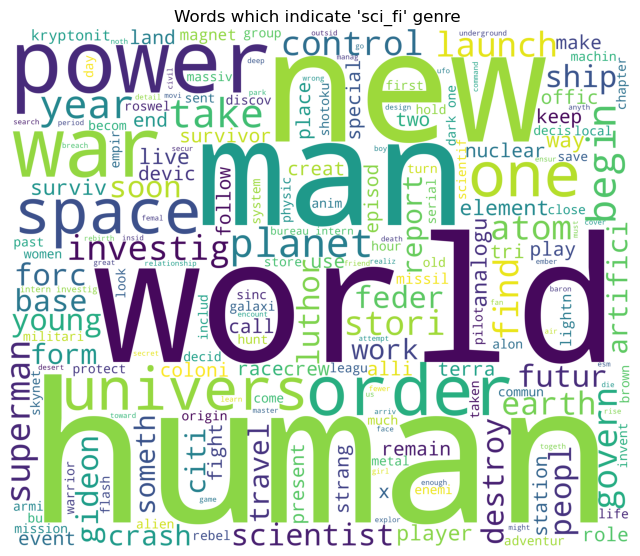

In [32]:
wordcloud14 = WordCloud(background_color='white', width=3000, height=2500).generate(sci_fi)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud14)
plt.axis('off')
plt.title("Words which indicate 'sci_fi' genre ")
plt.show()

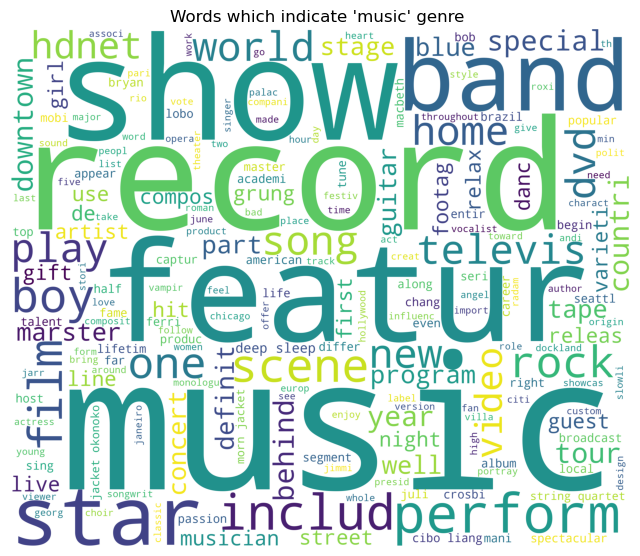

In [33]:
wordcloud15 = WordCloud(background_color='white', width=3000, height=2500).generate(music)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud15)
plt.axis('off')
plt.title("Words which indicate 'music' genre ")
plt.show()

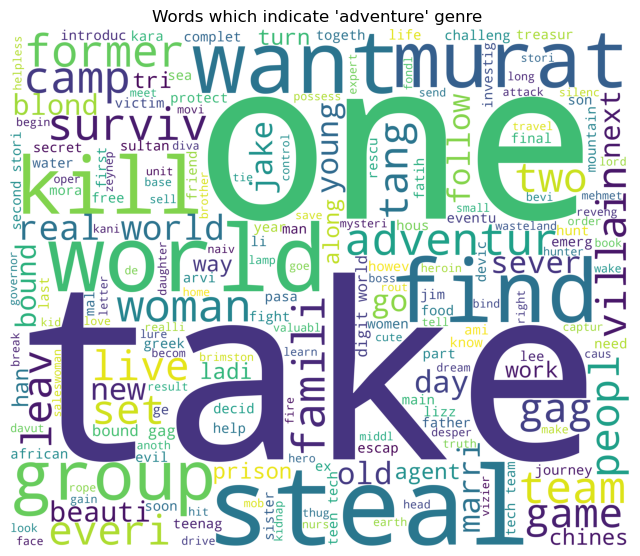

In [34]:
wordcloud16 = WordCloud(background_color='white', width=3000, height=2500).generate(adventure)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud16)
plt.axis('off')
plt.title("Words which indicate 'adventure' genre ")
plt.show()

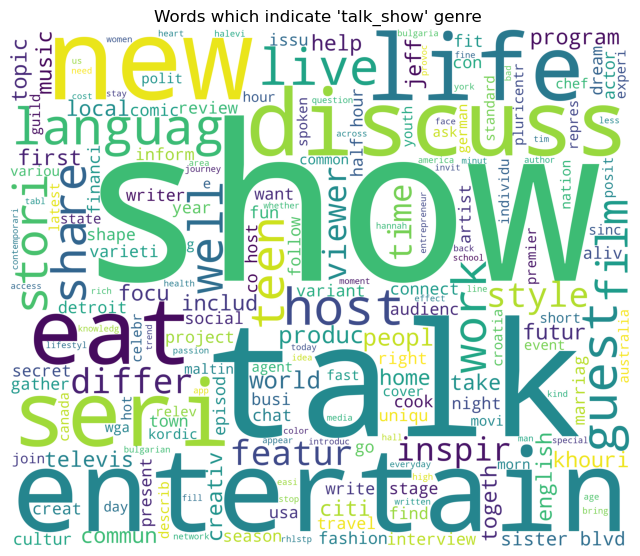

In [35]:
wordcloud17 = WordCloud(background_color='white', width=3000, height=2500).generate(talk_show)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud17)
plt.axis('off')
plt.title("Words which indicate 'talk_show' genre ")
plt.show()

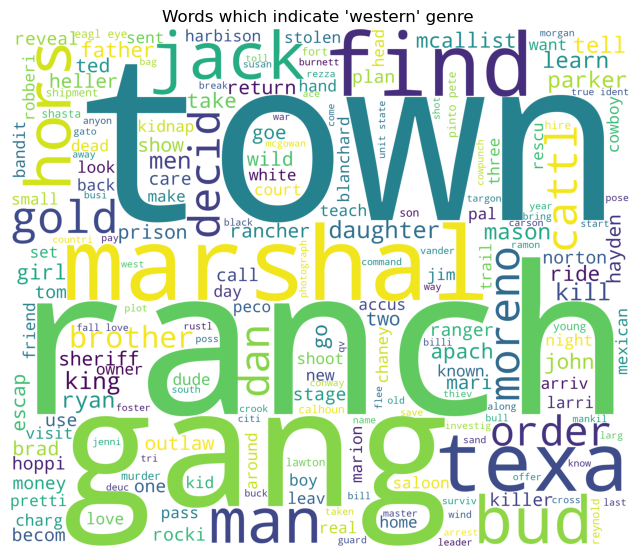

In [36]:
wordcloud18 = WordCloud(background_color='white', width=3000, height=2500).generate(western)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud18)
plt.axis('off')
plt.title("Words which indicate 'western' genre ")
plt.show()

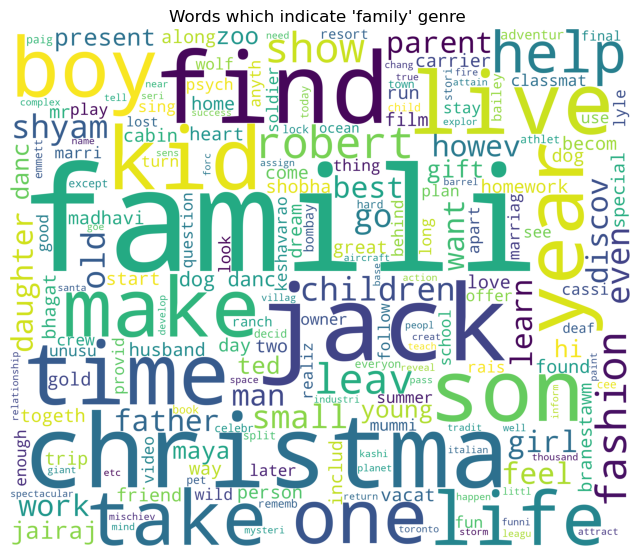

In [37]:
wordcloud19 = WordCloud(background_color='white', width=3000, height=2500).generate(family)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud19)
plt.axis('off')
plt.title("Words which indicate 'family' genre ")
plt.show()

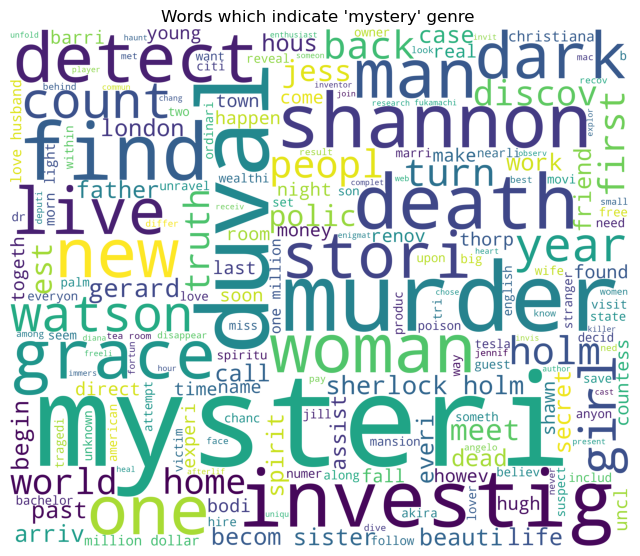

In [38]:
wordcloud20 = WordCloud(background_color='white', width=3000, height=2500).generate(mystery)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud20)
plt.axis('off')
plt.title("Words which indicate 'mystery' genre ")
plt.show()

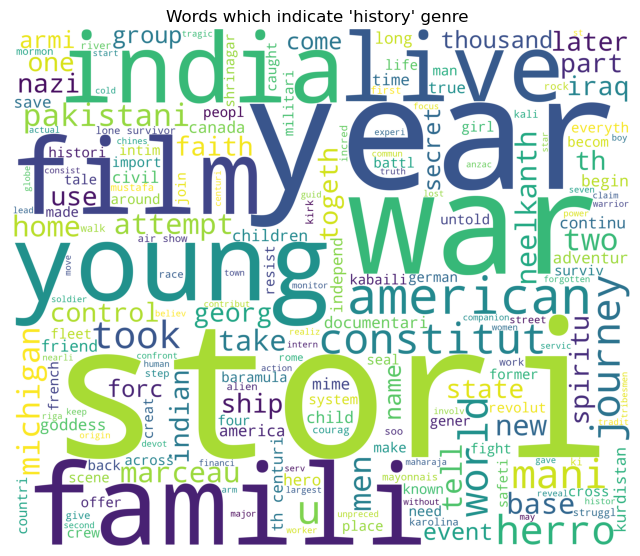

In [39]:
wordcloud21 = WordCloud(background_color='white', width=3000, height=2500).generate(history)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud21)
plt.axis('off')
plt.title("Words which indicate 'history' genre ")
plt.show()

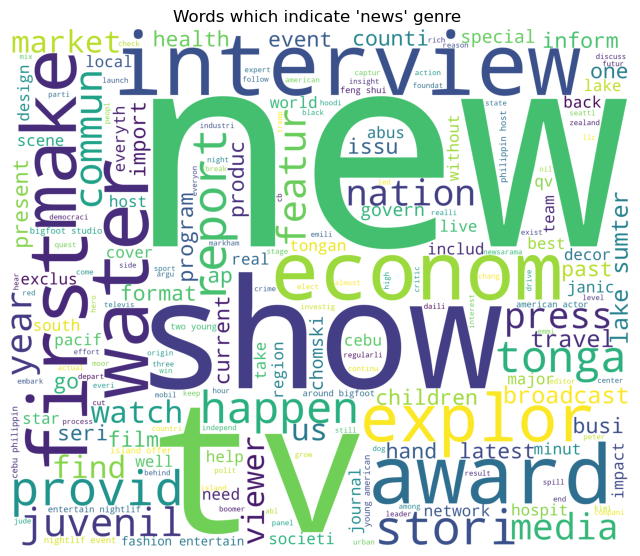

In [40]:
wordcloud22 = WordCloud(background_color='white', width=3000, height=2500).generate(news)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud22)
plt.axis('off')
plt.title("Words which indicate 'news' genre ")
plt.show()

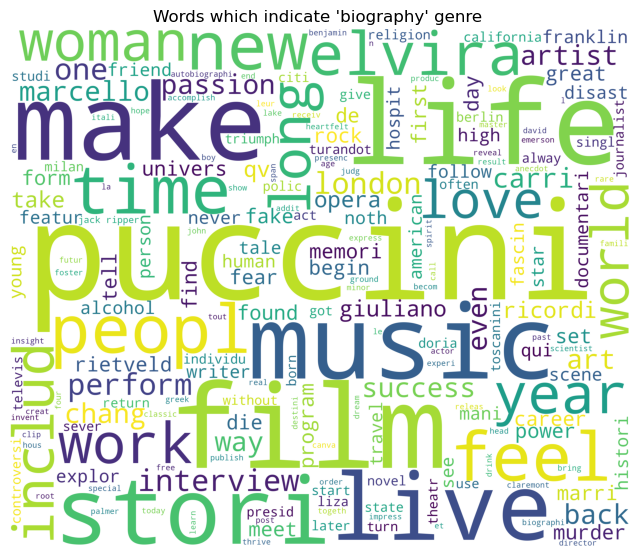

In [41]:
wordcloud23 = WordCloud(background_color='white', width=3000, height=2500).generate(biography)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud23)
plt.axis('off')
plt.title("Words which indicate 'biography' genre ")
plt.show()

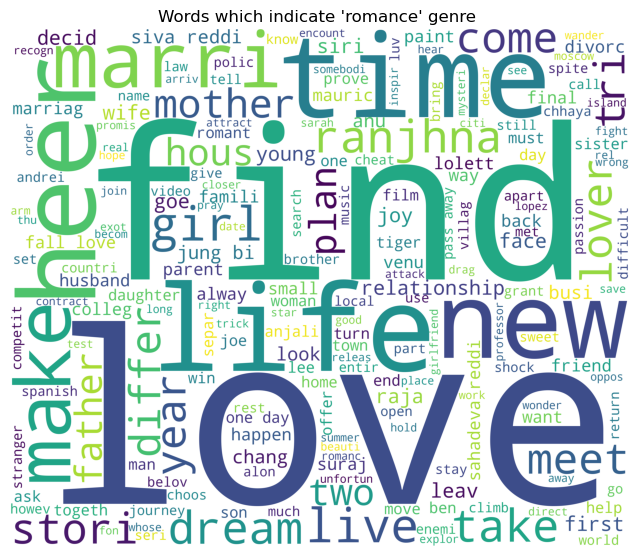

In [42]:
wordcloud24 = WordCloud(background_color='white', width=3000, height=2500).generate(romance)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud24)
plt.axis('off')
plt.title("Words which indicate 'romance' genre ")
plt.show()

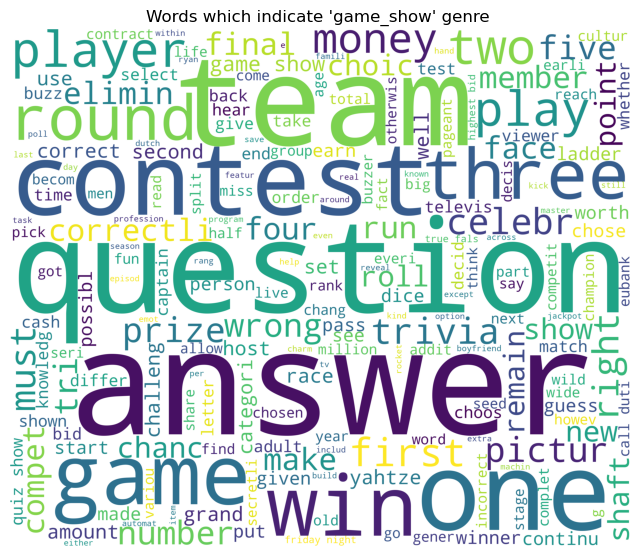

In [43]:
wordcloud25 = WordCloud(background_color='white', width=3000, height=2500).generate(game_show)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud25)
plt.axis('off')
plt.title("Words which indicate 'game_show' genre ")
plt.show()

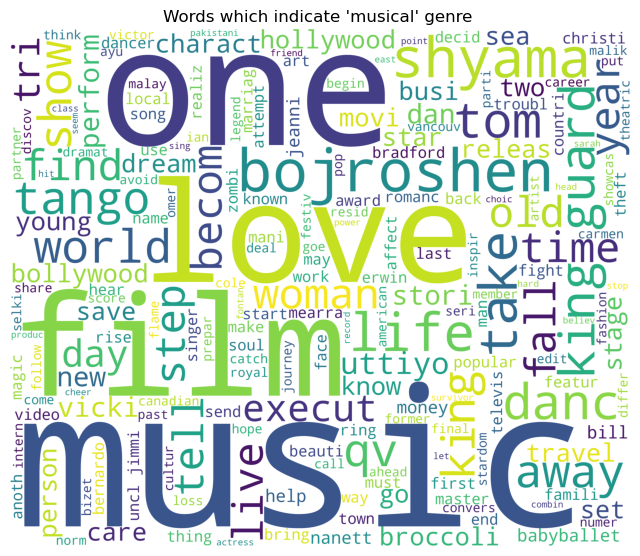

In [44]:
wordcloud26 = WordCloud(background_color='white', width=3000, height=2500).generate(musical)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud26)
plt.axis('off')
plt.title("Words which indicate 'musical' genre ")
plt.show()

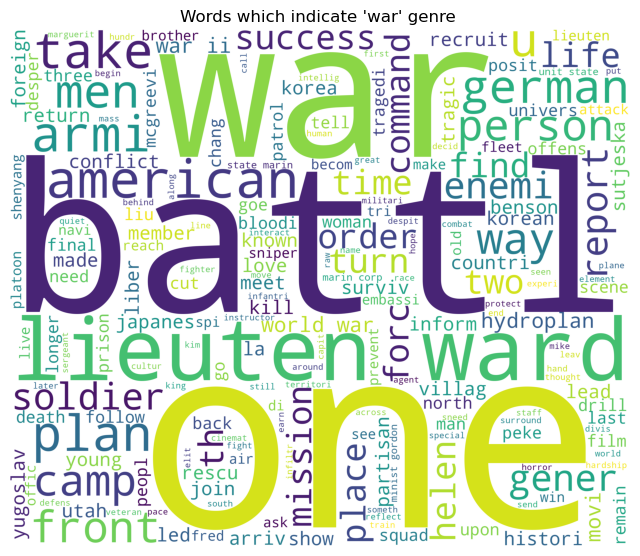

In [45]:
wordcloud27 = WordCloud(background_color='white', width=3000, height=2500).generate(war)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud27)
plt.axis('off')
plt.title("Words which indicate 'war' genre ")
plt.show()

In [2]:
import sklearn.preprocessing as pre_process
from sklearn.model_selection import train_test_split
import sklearn.linear_model as lm
ordinal_encoding=pre_process.OrdinalEncoder()

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer

description = df['Description']


vectorizer = TfidfVectorizer(max_features=120614)


X = vectorizer.fit_transform(description)

 
print(vectorizer.get_feature_names_out())
print(X.shape)


processed_x =  X


['00' '000' '0000' ... 'żpleasure' 'żte' 'żwhere']
(54214, 120614)


In [8]:
y=df["Genre"]
import numpy as np
ordinal_encoder=pre_process.OrdinalEncoder()
processed_y=ordinal_encoder.fit_transform(np.c_[y])
processed_y

array([[ 8.],
       [24.],
       [ 1.],
       ...,
       [ 7.],
       [ 5.],
       [12.]])

In [9]:
from sklearn.model_selection import train_test_split
train_x,test_x,train_y,test_y = train_test_split( processed_x , processed_y,test_size=0.10,random_state=42)


In [66]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

model.fit(train_x,train_y )

C:\Users\Mujtaba Raza\anaconda3\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Mujtaba Raza\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [67]:
pred_y=model.predict(test_x)
pred_y

array([8., 8., 7., ..., 8., 8., 5.])

In [68]:
accuracy = model.score(test_x, test_y)



In [69]:
print("---- Score ----")
print("Accuracy score is: {}%".format(round(accuracy*100,2)))

---- Score ----
Accuracy score is: 59.33%


In [70]:

test = pd.read_csv('test_data.txt', delimiter=":::", header=None,engine="python")


test.columns = ['Id', 'Title','Description']
test

,Id,Title,Description
0,1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),Before he was known internationally as a mart...
...,...,...,...
54195,54196,"""Tales of Light & Dark"" (2013)","Covering multiple genres, Tales of Light & Da..."
54196,54197,Der letzte Mohikaner (1965),As Alice and Cora Munro attempt to find their...
54197,54198,Oliver Twink (2007),A movie 169 years in the making. Oliver Twist...
54198,54199,Slipstream (1973),"Popular, but mysterious rock D.J Mike Mallard..."


In [71]:
print(test.info())
print(type(test))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54200 entries, 0 to 54199
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Id           54200 non-null  int64 
 1   Title        54200 non-null  object
 2   Description  54200 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.2+ MB
None
<class 'pandas.core.frame.DataFrame'>


In [72]:
test.isnull().sum()

Id             0
Title          0
Description    0
dtype: int64

In [73]:
def genre_prediction(sample_script):
    sample_script = re.sub(pattern='[^a-zA-Z]',repl=' ', string=sample_script)
    sample_script = sample_script.lower()
    sample_script_words = sample_script.split()
    sample_script_words = [word for word in sample_script_words if not word in set(stopwords.words('english'))]
    ps = PorterStemmer()
    final_script = [ps.stem(word) for word in sample_script_words]
    final_script = ' '.join(final_script)
    temp = cv.transform([final_script]).toarray()
    return model.predict(temp)[0]


In [74]:
description=test["Description"]

In [75]:
description


0         L.R. Brane loves his life - his car, his apar...
1         Spain, March 1964: Quico is a very naughty ch...
2         One year in the life of Albin and his family ...
3         His father has died, he hasn't spoken with hi...
4         Before he was known internationally as a mart...
                               ...                        
54195     Covering multiple genres, Tales of Light & Da...
54196     As Alice and Cora Munro attempt to find their...
54197     A movie 169 years in the making. Oliver Twist...
54198     Popular, but mysterious rock D.J Mike Mallard...
54199     Curitiba is a city in movement, with rhythms ...
Name: Description, Length: 54200, dtype: object

In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Define the vectorizer object
cv = TfidfVectorizer()

# Fit the vectorizer to the input data
cv.fit(description)


TfidfVectorizer()

In [77]:
from random import randint

row = randint(0, test.shape[0]-650)
sample_script = test.Description[row]

print('Script: {}'.format(sample_script))
value = genre_prediction(sample_script)
print('Prediction: {}'.format(list(genre_mapper.keys())[int(value)]))


Script:  IVY VIGILANTE is a character-driven, surreal drama with humorous undertones. The story tells about the self-destructive woman Ivy, who during a visit to a psychotherapist opens her "Pandora's box" when she looks back at her past to understand her destructive personality.
Prediction: crime


In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer

description = test['Description']

vectorizer = TfidfVectorizer()
precit1_X = vectorizer.fit_transform(description)
print(vectorizer.get_feature_names_out())
print(precit1_X.shape)


['00' '000' '0005' ... 'żpodrá' 'żwho' 'žnominated']
(54200, 120614)


In [79]:
finalpredictions = model.predict(precit1_X)
predictions_df = pd.DataFrame({'Id': test['Title'], 'Predicted_Genre': finalpredictions})
predictions_df['Actual_Genre'] = predictions_df['Predicted_Genre'].map(genre_mapper)


In [80]:
predictions_df

,Id,Predicted_Genre,Actual_Genre
0,Edgar's Lunch (1998),5.0,NaN
1,La guerra de papá (1977),8.0,NaN
2,Off the Beaten Track (2010),21.0,NaN
3,Meu Amigo Hindu (2015),5.0,NaN
4,Er nu zhai (1955),8.0,NaN
...,...,...,...
54195,"""Tales of Light & Dark"" (2013)",7.0,NaN
54196,Der letzte Mohikaner (1965),5.0,NaN
54197,Oliver Twink (2007),5.0,NaN
54198,Slipstream (1973),21.0,NaN


In [83]:
from sklearn.feature_extraction.text import TfidfVectorizer

description = test['Description']

vectorizer = TfidfVectorizer()
precit1_X = vectorizer.fit_transform(description)

# Predict genres
finalpredictions = model.predict(precit1_X)

# Create a DataFrame to store the predictions
predictions_df = pd.DataFrame({'Id': test['Title'], 'Predicted_Genre': finalpredictions})

# Define the genre mapping dictionary
genre_mapper1 = {
    1.0: 'drama', 2.0: 'thriller', 3.0: 'adult', 4.0: 'documentary', 5.0: 'comedy',
    6.0: 'crime', 7.0: 'reality-tv', 8.0: 'horror', 9.0: 'sport', 10.0: 'animation',
    11.0: 'action', 12.0: 'fantasy', 13.0: 'short', 14.0: 'sci-fi', 15.0: 'music',
    16.0: 'adventure', 17.0: 'talk-show', 18.0: 'western', 19.0: 'family',
    20.0: 'mystery', 21.0: 'history', 22.0: 'news', 23.0: 'biography',
    24.0: 'romance', 25.0: 'game-show', 26.0: 'musical', 27.0: 'war'
}

predictions_df['Genre names'] = predictions_df['Predicted_Genre'].map(genre_mapper1)


predictions_df


,Id,Predicted_Genre,Genre names
0,Edgar's Lunch (1998),5.0,comedy
1,La guerra de papá (1977),8.0,horror
2,Off the Beaten Track (2010),21.0,history
3,Meu Amigo Hindu (2015),5.0,comedy
4,Er nu zhai (1955),8.0,horror
...,...,...,...
54195,"""Tales of Light & Dark"" (2013)",7.0,reality-tv
54196,Der letzte Mohikaner (1965),5.0,comedy
54197,Oliver Twink (2007),5.0,comedy
54198,Slipstream (1973),21.0,history


In [ ]:
#predictions_df.to_csv('genre_predictions.csv', index=False)
